In [1]:
### Run This Code Before Presentation ###
import numpy as np
import os
import pandas as pd
from pandas.api.types import CategoricalDtype
import matplotlib.pyplot as plt
import geopandas as gpd
import csv
from geopy.distance import geodesic
import numpy as np
from matplotlib.colors import ListedColormap
import contextily as cx
import mapclassify
import palettable
import folium
import seaborn as sns
from scipy.__config__ import show

slc_shapefile_path = 'zcta_data/slc_zcta.shp'
slc_gdf = gpd.read_file(slc_shapefile_path)

slc_zcta_list_path = './zcta_data/slc_zcta.csv'

slc_zcta_list = []

with open(slc_zcta_list_path, newline='') as csvfile:
    reader = csv.reader(csvfile, delimiter=',')
    for row in reader:
        int_row = [int(i) for i in row]
        slc_zcta_list.append(int_row)
        
slc_zcta_list = [item for sublist in slc_zcta_list for item in sublist]

# Load the race population data
race_pop_path = './data/census_data/race_pop_by_latino_df.csv'
race_pop_df = pd.read_csv(race_pop_path)
race_pop_df = race_pop_df[race_pop_df['ZCTA5'].isin(slc_zcta_list)]
race_pop_df.columns = race_pop_df.columns.str.strip()
race_pop_df = race_pop_df.replace(',','', regex=True)
race_pop_df = race_pop_df.astype(int)
race_pop_df = race_pop_df.reset_index(drop=True)
race_pop_df['Perc_NonWhite'] = round(((race_pop_df['Total:'] - race_pop_df['White alone']) / race_pop_df['Total:'])*100, 1)
race_pop_gdf = slc_gdf.merge(race_pop_df, left_on='ZCTA5', right_on='ZCTA5')

# Load the median household income data
median_hh_income_path = './data/census_data/median_hh_income_df.csv'
median_hh_income_df = pd.read_csv(median_hh_income_path)
median_hh_income_df = median_hh_income_df[median_hh_income_df['ZCTA5'].isin(slc_zcta_list)]
median_hh_income_df.columns = median_hh_income_df.columns.str.strip()
median_hh_income_df = median_hh_income_df.replace(',','', regex=True)
median_hh_income_df = median_hh_income_df.replace('-', np.nan)
median_hh_income_df = median_hh_income_df.rename(columns={'Median household income in the past 12 months (in 2021 inflation-adjusted dollars)': 'Median_HH_Income'})
median_hh_income_df['Median_HH_Income'] = median_hh_income_df['Median_HH_Income'].astype(float)
median_hh_income_df = median_hh_income_df.reset_index(drop=True)
median_hh_income_gdf = slc_gdf.merge(median_hh_income_df, left_on='ZCTA5', right_on='ZCTA5')

# Load median house value data
house_value_path = './data/census_data/median_house_value_df.csv'
house_value_df = pd.read_csv(house_value_path)
house_value_df = house_value_df[house_value_df['ZCTA5'].isin(slc_zcta_list)]
house_value_df.columns = house_value_df.columns.str.strip()
house_value_df = house_value_df.replace(',','', regex=True)
house_value_df = house_value_df.replace('-', np.nan)
house_value_df = house_value_df.rename(columns={'Median value (dollars)': 'Median_House_Value'})
house_value_df['Median_House_Value'] = house_value_df['Median_House_Value'].astype(float)
house_value_df = house_value_df.reset_index(drop=True)
house_value_gdf = slc_gdf.merge(house_value_df, left_on='ZCTA5', right_on='ZCTA5')

### Load the AQ data into df ###

trax01_df = pd.read_csv('./data/transit_dfs/TRX01_df.csv', low_memory=False, header=1)
trax02_df = pd.read_csv('./data/transit_dfs/TRX02_df.csv', low_memory=False, header=1)
trax03_df = pd.read_csv('./data/transit_dfs/TRX03_df.csv', low_memory=False, header=1)
bus01_df = pd.read_csv('./data/transit_dfs/BUS01_df.csv', low_memory=False, header=1)
bus02_df = pd.read_csv('./data/transit_dfs/BUS02_df.csv', low_memory=False, header=1)
bus03_df = pd.read_csv('./data/transit_dfs/BUS03_df.csv', low_memory=False, header=1)
bus04_df = pd.read_csv('./data/transit_dfs/BUS04_df.csv', low_memory=False, header=1)
bus05_df = pd.read_csv('./data/transit_dfs/BUS05_df.csv', low_memory=False, header=1)
bus06_df = pd.read_csv('./data/transit_dfs/BUS06_df.csv', low_memory=False, header=1)
bus07_df = pd.read_csv('./data/transit_dfs/BUS07_df.csv', low_memory=False, header=1)

concat_list = [trax01_df, trax02_df, trax03_df, bus01_df, bus02_df, bus03_df, bus04_df, bus05_df, bus06_df, bus07_df]

concat_df = pd.concat(concat_list, ignore_index=True)

AQI_category = CategoricalDtype(categories=["Good", "Moderate", "Unhealthy for Sensitive Groups", 
                                            "Unhealthy", "Very Unhealthy", "Hazardous"], ordered=True)
PM25_Category = CategoricalDtype(categories=["< 12.00", "12.00 - 35.50", "35.50 - 85.50", 
                                                "115.00 - 150.50", "150.50+"], ordered=True)
MesoWest_Category = CategoricalDtype(categories=['< 2.00', '2.00 - 4.00', '4.00 - 6.00', 
                                                    '6.00 - 8.00', '8.00 - 10.00','10.00 - 12.00',
                                                    '12.00 - 20.00','20.00 - 28.00','28.00 - 35.50',
                                                    '35.50 - 45.50','45.50 - 55.50','55.50 - 85.50',
                                                    '85.50 - 115.50','115.50 - 150.50','150.50+'], ordered=True)

concat_df['AQI'] = concat_df['AQI'].astype(AQI_category)
concat_df['PM2.5_Category'] = concat_df['PM2.5_Category'].astype(PM25_Category)
concat_df['Meso_West_Category'] = concat_df['Meso_West_Category'].astype(MesoWest_Category)

#rename columns
concat_df.rename(columns={'Meso_West_Category': 'PM2.5_Concentration_(ug/m3)'}, inplace=True)
median_hh_income_gdf.rename(columns={'Median_HH_Income': 'Median_Household_Income'}, inplace=True)
race_pop_gdf.rename(columns={'Perc_NonWhite': 'Percent_NonWhite'}, inplace=True)

geo_df = gpd.GeoDataFrame(
    concat_df,
    geometry=gpd.points_from_xy(concat_df.Longitude_ddeg, concat_df.Latitude_ddeg),
    crs='EPSG:4326'
)

## INVERSION -- Bad Air day from initial explore of dataset -- solid East/West discrepancy - INVERSION?
inversion_date = "2022-01-13" 
inversion_df = geo_df[geo_df['Date'] == inversion_date]
inversion_df = inversion_df[inversion_df['Hour'] < 15]


## SMOKE --Solid example of west/east discrepancy with bad SMOKE in the air
smoke_date = '2021-08-06' 
smoke_df = geo_df[geo_df['Date'] == smoke_date]
smoke_df = smoke_df[smoke_df['Hour'] > 18]


Meso_West_cmap = ['#00FFFF','#00CCFF','#0099FF','#00FF00','#009900','#006600','#FFFF00','#FFE600','#FFCD00','#FF7E00','#FF5000','#FF0000','#990000','#CC0033','#FF00FF']

# **West-side Salt Lake City Air Quality Investigation**
## Mobile Air Quality Monitoring
**COMP 5960: Applied Data Visualization Final Project - Fall 2023**  
**Authors:** Tony Le (u1368721), Adrian Martino (u1431239), John Stevens (u1117706)  
**GitHub Repository:** https://github.com/anth0nyhle/MobileAirQualitySLV  
**Date:** 04 December 2023

Salt Lake City (SLC), like many urban areas, faces challenges related to air quality due to factors such as industrial emissions, traffic, and weather conditions that can trap pollutants in the valley. With a population of just over 1 million people, SLC sees an annual average of 40 days where pollutant levels exceed the US National Ambient Air Quality Standards (NAAQS) [1]. These exceedances result from a combination of meteorological patterns, unique topography, and emissions in SLC.

![](./images/slv_inversion_20230203.png)

_Unhealthy air quality settles over Salt Lake Valley on Friday, February 3, 2023. (Source: [Salt Lake Tribune](https://www.sltrib.com/news/environment/2023/02/03/salt-lake-heading-into-worst/), Francisco Kjolseth)_

During winter, elevated levels of PM2.5 are a concern, primarily due to emissions accumulating in persistent cold air pools, also known as temperature inversions. On average, the SLV experiences 6.8 temperature inversions each winter, lasting 3.1 days [2]. This exceeds the NAAQS for PM2.5 of 35 µg/m3 for an average of 18 days per winter [2]. Average winter temperatures range from 3.5°C to -6°C, with an average snowfall of 110 cm. The presence of snow cover helps reflect sunlight, maintaining cool surface temperatures and intensifying these wintertime temperature inversions. In contrast, average summer temperatures range from 32°C to 16°C.

However, prolonged periods of heat and stagnation occur due to high-pressure ridges over the Western US. These conditions, coupled with emissions from urban areas and wildfire smoke, contribute to elevated ground-level ozone production, which exceeds the NAAQS on an average of 22 days each year [3].

As SLC residents, these NAAQS exceedances in PM2.5, contributing to poor air quality in the valley, are concerning. Poor air quality can have significant health effects, such as exacerbating respiratory conditions and increasing the risk of cardiovascular diseases. 

<p alight="left">
  <img src="./images/LifeExpectancyImage.png" width="600"/>
</p>

None of this is new to any of us that have lived here for long. In the winter, inversions are commonplace and in summer, it's wildfire smoke. It is well known that Salt Lake City has bad air quality and the data is clear. 

To those living in Salt Lake's west side--an area with a higher proportion of minority residents and generally lower income levels--the knowledge that air quality is worse in their neighborhood compared to their east side counterparts is also nothing new. What is new, however, is data to corroborate those claims.

<p alight="left">
  <img src="./images/WestSideDataImage.png" width="600"/>
</p>

While numerous articles address and highlight these disparities, we have yet to come across easily understandable and impactful visuals designed for the general public. Academic papers and in-depth studies, while informative, are not the most effective means of conveying this message to a broader audience due to their academic nature. Therefore, we are motivated to bring awareness to this issue and enable easier access to easily digestible data visualizations for the public, voters, and legislators to assess its impact on public health, identify at-risk populations, and develop strategies for mitigating health risks.

*(Including for now, but maybe we dont include it since we didnt create this chart?)*
<p alight="left">
  <img src="./images/LifeExpectancyChart.png" width="600"/>
</p>

In [ ]:
# Tony will put socioecon maps here
#I put all three base maps (e.g. below) and each combo of base map and AQ day (inversion/smoke) in the images folder in case they're helpful

To start, we wanted to visualize the socioeconomic and demographic variablility across the valley.

<p alight="left">
  <img src="./images/PercentNonWhite.png" width="600"/>
</p>

To visualize how air quality might differ from one side of the valley to the other, it would be helpful to see air quality data as it relates to this socioeconomic and demographic data.

Fortunately, the Department of Atmospheric Sciences at the University of Utah has implemented mobile air quality monitoring platforms on electric public transit vehicles that transect the Salt Lake Valley to observe the air quality on a more local level and offer insights into how air quality differs temporally and spatially [4]. This data can provide important insights that inform the creation of effective policies and standards to protect the environment and public health. Furthermore, air quality is closely related to climate change. This mobile monitoring of air quality data can help track emissions of greenhouse gasses and other pollutants, contributing to a better understanding of climate change and efforts to mitigate its effects.

Let's explore the claims that the west side has worse air quality by looking at an example.

<p alight="left">
  <img src="./images/InversionPercNonWhite.png" width="600"/>
</p>

#### When looking at the average air quality on the east side vs the west side over the course of an extended period of time, there doesn't seem to be much difference

In this case we have binned the data into two areas north of 6200 south and divided east and west by I15. The data doesn't show any stark differnces in air quality as both sides of the valley tend to follow the same trends.

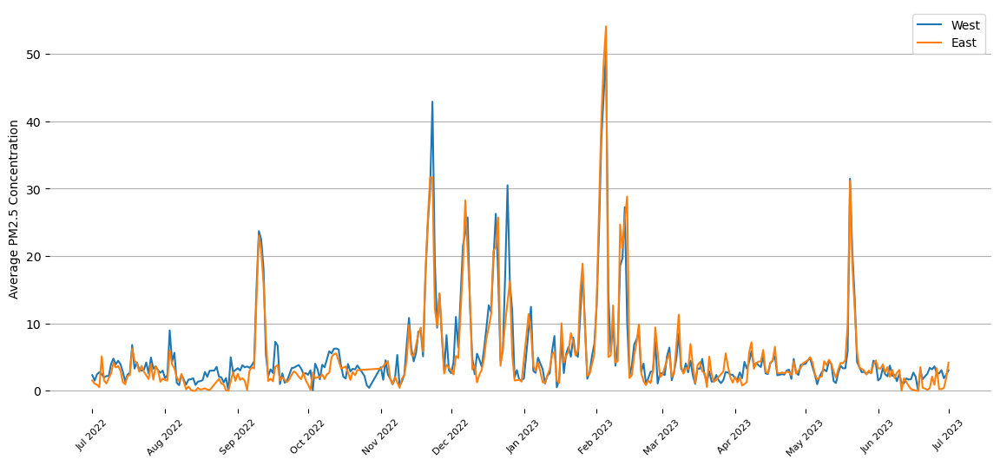

However, when you look at specific days such as January 13, 2022 when the air quality is notably terrible, the story begins to change. On this day we can see that even though it was bad everywhere, it was worse on the west side.

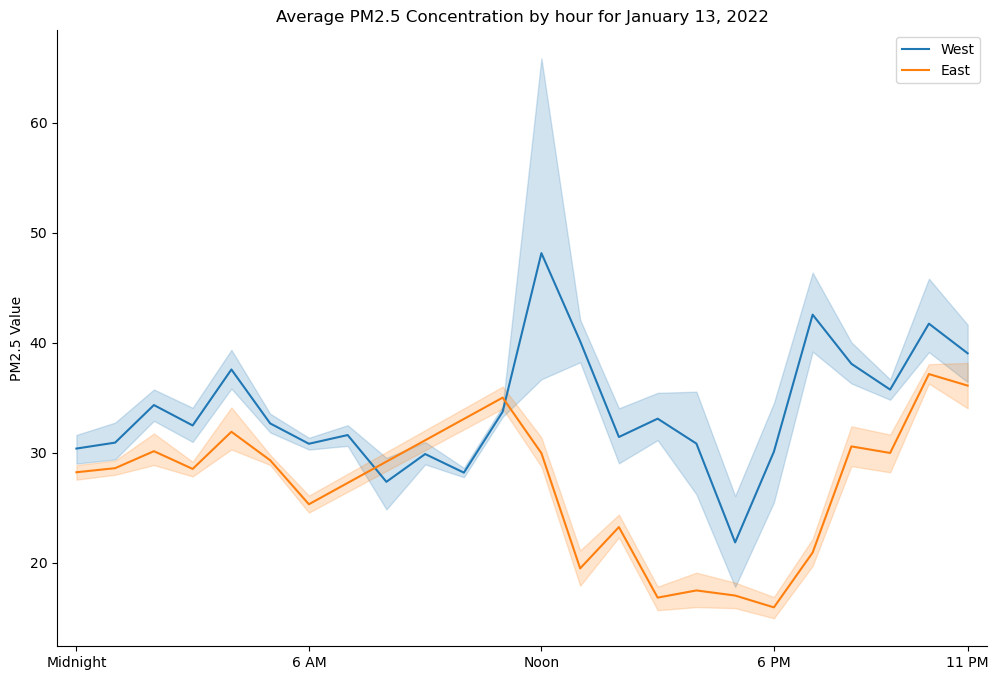

We can see this trend manifest itself the following day as well.

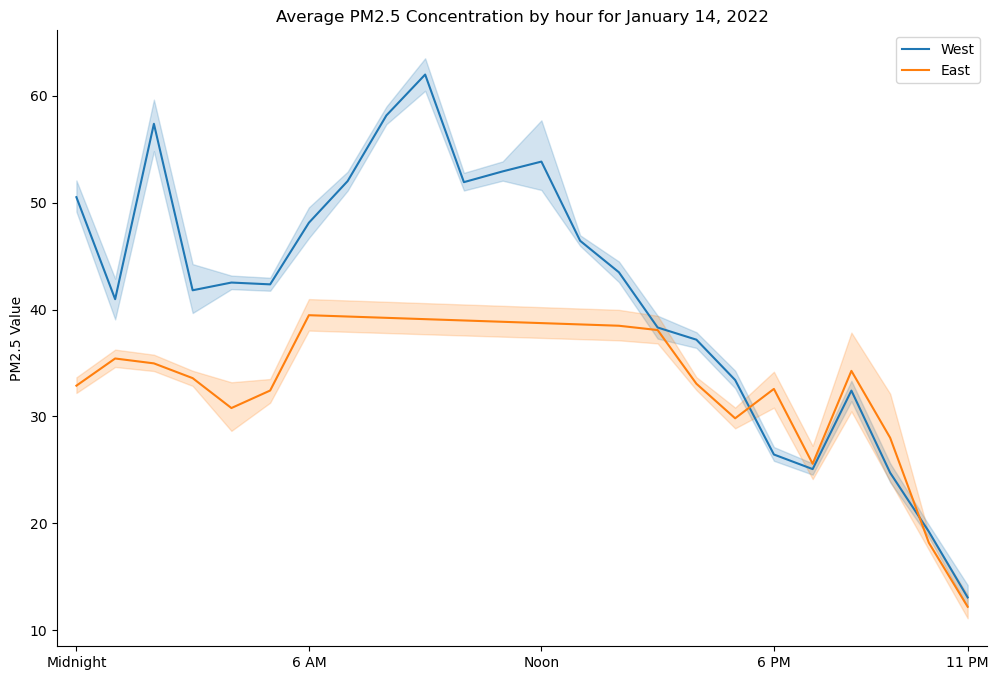

The plot thickens: when you look at a summer day when the air quality was known to be bad, the difference isn't as stark.

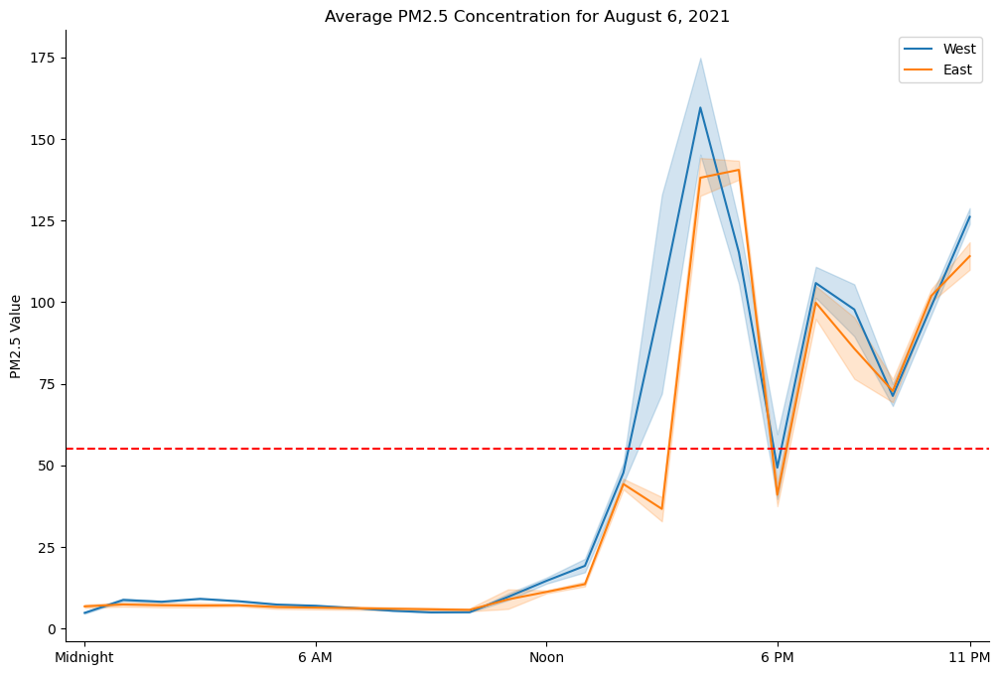

As you can see in a different way, the West Side has distinctly worse air quality throughout this day

Use the interactive map below to explore the data for yourself!

In [3]:
### Interactive Map Code ###
m = race_pop_gdf.explore(
    column='Percent_NonWhite', 
    cmap='Purples', 
    tooltip=False,
    #tiles="CartoDB positron",
    tiles=None,
    style_kwds={'fillOpacity': 0.4, 'weight': 1, 'color': 'black'},
    popup=['Percent_NonWhite'],
    highlight=False,
    name='Percent Non-White',
    overlay=False,
)

hh_income = median_hh_income_gdf.explore(
    m=m,
    column='Median_Household_Income', 
    cmap='Greens_r', 
    tooltip=False,
    #tiles="CartoDB positron",
    tiles=None,
    style_kwds={'fillOpacity': 0.4, 'weight': 1, 'color': 'black'},
    popup=['Median_Household_Income'],
    highlight=False,
    show=False,
    name='Median Household Income',
    overlay=False,
)

house_value = house_value_gdf.explore(
    m=m,
    column='Median_House_Value', 
    cmap='Oranges_r', 
    tooltip=False,
    #tiles="CartoDB positron",
    tiles=None,
    style_kwds={'fillOpacity': 0.4, 'weight': 1, 'color': 'black'},
    popup=['Median_House_Value'],
    highlight=False,
    show=False,
    name='Median House Value',
    overlay=False,
)

smoke_data = smoke_df.explore(
    m=m,
    #column='AQI',
    column='PM2.5_Concentration_(ug/m3)',
    #column='PM2.5_Category',
    #column='ES642_PM2.5_Concentration_ug/m3',
    #cmap=['green', 'yellow', 'orange', 'red', 'purple', 'maroon'],
    cmap=Meso_West_cmap,
    marker_type='circle_marker',
    marker_kwds={'radius': 5, 'fill': True, 'alpha': 1},
    style_kwds={'fillOpacity': 1, 'weight': 1, 'color': 'black'},
    tooltip=['ES642_PM2.5_Concentration_ug/m3','AQI', 'PM2.5_Concentration_(ug/m3)','Timestamp_UTC', 'Transit_ID','Hour'],
    #tiles="CartoDB positron",
    tiles=None,
    name='Wildfire Smoke (Aug. 6, 2021)',
    overlay=True,
    #control=False,
    show=False,
)

inversion_data = inversion_df.explore(
    m=m,
    #column='AQI',
    column='PM2.5_Concentration_(ug/m3)',
    #column='PM2.5_Category',
    #column='ES642_PM2.5_Concentration_ug/m3',
    #cmap=['green', 'yellow', 'orange', 'red', 'purple', 'maroon'],
    cmap=Meso_West_cmap,
    marker_type='circle_marker',
    marker_kwds={'radius': 5, 'fill': True, 'alpha': 1},
    style_kwds={'fillOpacity': 1, 'weight': 1, 'color': 'black'},
    tooltip=['ES642_PM2.5_Concentration_ug/m3','AQI', 'PM2.5_Concentration_(ug/m3)','Timestamp_UTC', 'Transit_ID','Hour'],
    #tiles="CartoDB positron",
    tiles=None,
    name='Inversion (Jan. 13, 2022)',
    overlay=True,
    #control=False,
    show=True,
)

folium.raster_layers.TileLayer(tiles='CartoDB positron', name='CartoDB positron', control=False).add_to(m)

folium.LayerControl(collapsed = False, ).add_to(m) 

m

Conclusions/Further Research:
- Did good work, still not super easy to digest visually
- More spacial variablility of AQ sensors would be needed for this viz technique to be really convincing
- The East-West discrepancy that we were hoping to show is not as obvious as we thought (possibly due to lots of noise from a LOT of data)

### References
1. Mitchell LE, Crosman ET, Jacques AA, Fasoli B, Leclair-Marzolf L, Horel J, Bowling DR, Ehleringer JR, Lin JC. Monitoring of greenhouse gases and pollutants across an urban area using a light-rail public transit platform. Atmospheric Environment. 2018 Aug 1;187:9-23.
2. Whiteman CD, Hoch SW, Horel JD, Charland A. Relationship between particulate air pollution and meteorological variables in Utah's Salt Lake Valley. Atmospheric Environment. 2014 Sep 1;94:742-53.
3. Horel J, Crosman E, Jacques A, Blaylock B, Arens S, Long A, Sohl J, Martin R. Summer ozone concentrations in the vicinity of the Great Salt Lake. Atmospheric Science Letters. 2016 Sep;17(9):480-6.
4. Mendoza DL, Crosman ET, Mitchell LE, Jacques AA, Fasoli B, Park AM, Lin JC, Horel JD. The TRAX light-rail train air quality observation project. Urban Science. 2019 Dec 1;3(4):108.
5. Lin JC, Mitchell L, Crosman E, Mendoza DL, Buchert M, Bares R, Fasoli B, Bowling DR, Pataki D, Catharine D, Strong C. CO2 and carbon emissions from cities: Linkages to air quality, socioeconomic activity, and stakeholders in the Salt Lake City urban area. Bulletin of the American Meteorological Society. 2018 Nov 1;99(11):2325-39.
